<a href="https://colab.research.google.com/github/dariashcherbakovaaa/pet-projects/blob/main/Visualisation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

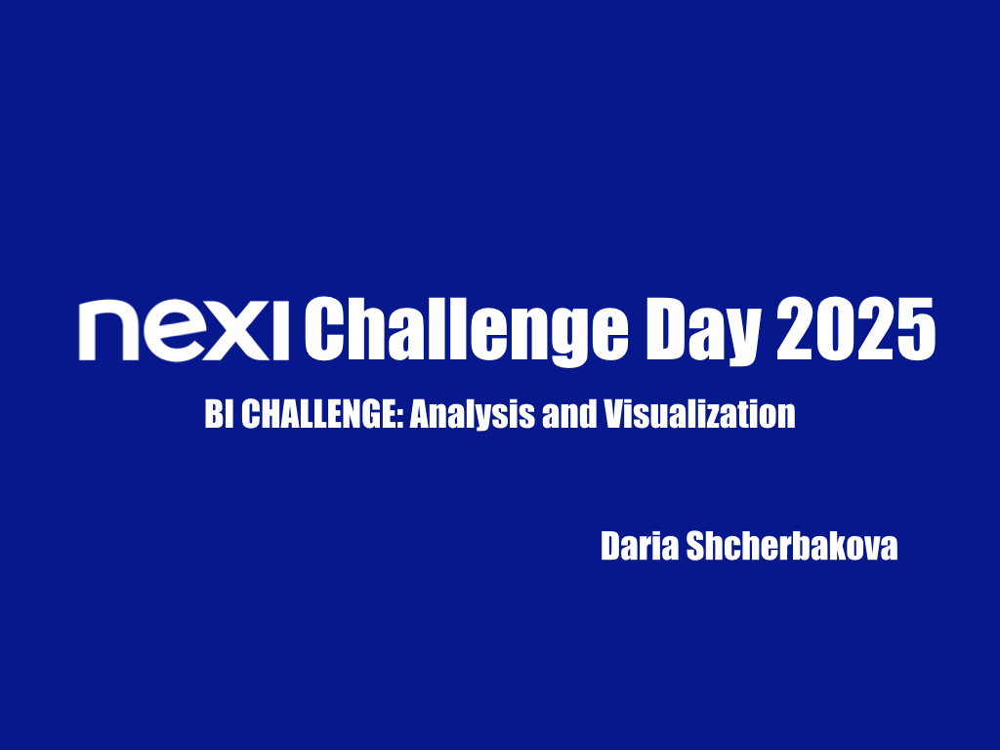

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from scipy.stats import ttest_ind

import numpy as np
import plotly.graph_objects as go
from plotly.subplots import make_subplots



In [ ]:
df = pd.read_csv('/content/drive/MyDrive/NEXI/ieee_challenge.csv', sep=';')
df.head(10)

,TransactionDT,TransactionAmt,isFraud,ProductCD,card4,card6,log_TransactionAmt,isOutlier,trx_day,trx_hour,trx_weekday,is_weekend,trx_hour_period,P_email,R_email,num_match_flags,Match_Level
0,86400,68.5,No,W,discover,credit,4.241327,No,1,0,1,No,night,no data,no data,4,Medium
1,86401,29.0,No,W,mastercard,credit,3.401197,No,1,0,1,No,night,gmail,no data,2,Low
2,86469,59.0,No,W,visa,debit,4.094345,No,1,0,1,No,night,outlook,no data,3,Medium
3,86499,50.0,No,W,mastercard,debit,3.931826,No,1,0,1,No,night,yahoo,no data,1,Low
4,86506,50.0,No,H,mastercard,credit,3.931826,No,1,0,1,No,night,gmail,no data,0,Low
5,86510,49.0,No,W,visa,debit,3.912023,No,1,0,1,No,night,gmail,no data,4,Medium
6,86522,159.0,No,W,visa,debit,5.075174,No,1,0,1,No,night,yahoo,no data,3,Medium
7,86529,422.5,No,W,visa,debit,6.048554,No,1,0,1,No,night,mail,no data,0,Low
8,86535,15.0,No,H,visa,debit,2.772589,No,1,0,1,No,night,anonymous,no data,0,Low
9,86536,117.0,No,W,mastercard,debit,4.770685,No,1,0,1,No,night,yahoo,no data,5,High


## **Marketing**

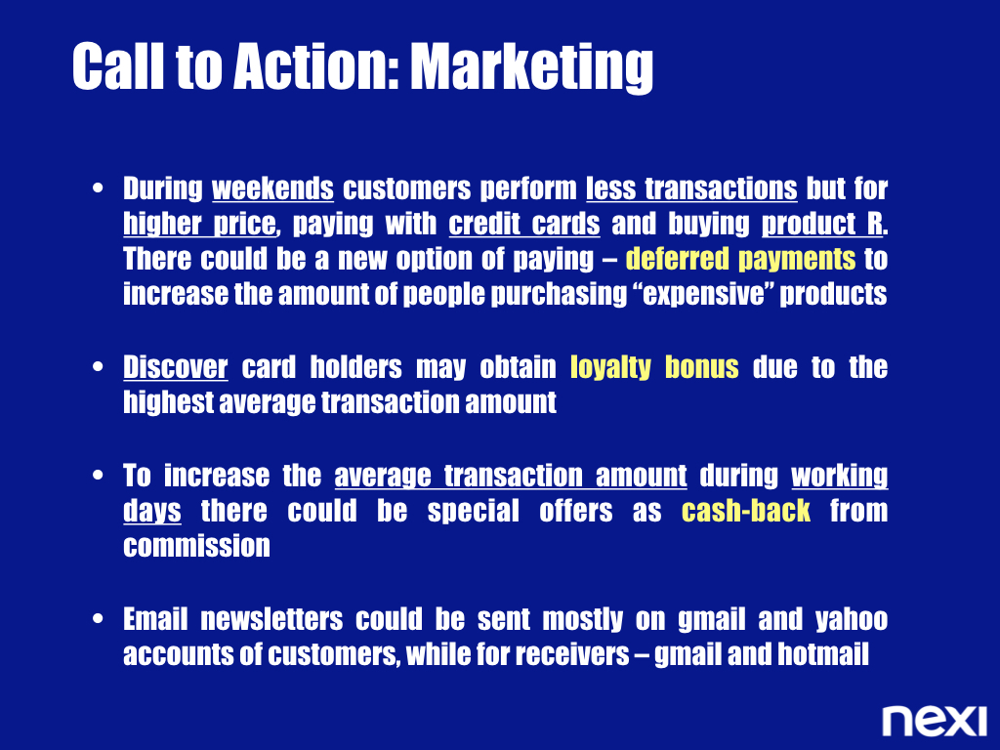

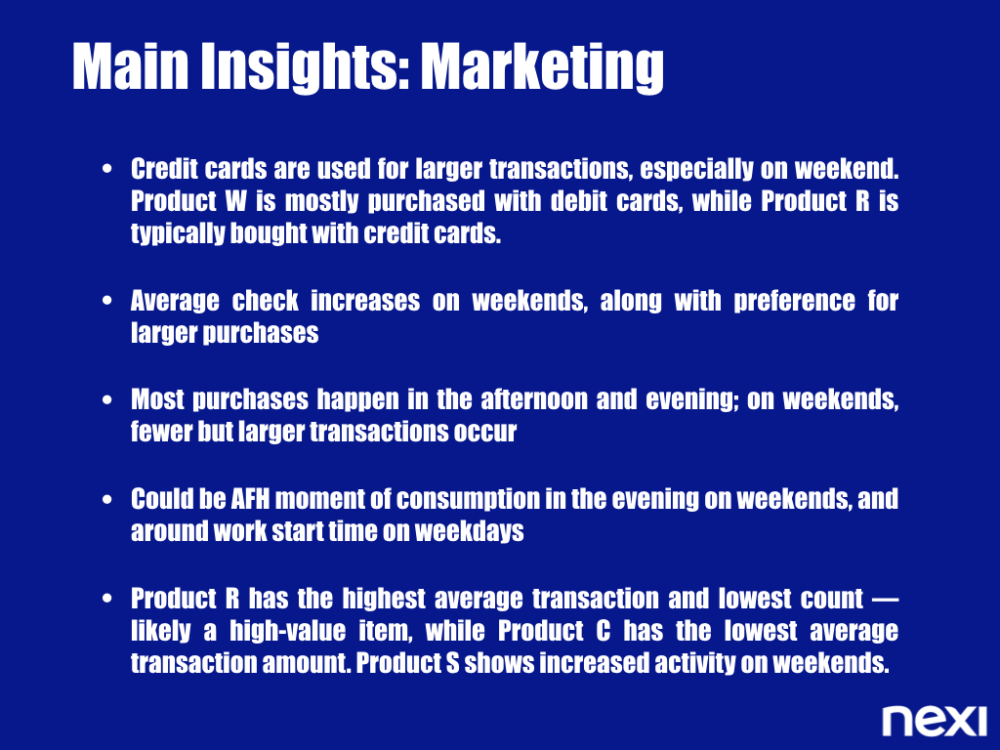

> Here we would like to analyse the customer behavior, that's why we need to focus on "non-Fraud transactions"

In [ ]:
df_marketing = df[df['isFraud'] == 'No']
df_m = df_marketing[df_marketing['isOutlier'] == 'No']
df_m.shape

(565907, 17)

### ***Card***

* Average amount of transaction  by card

In [ ]:
df_mf = df_m[(df_m['card4'] != 'no data') & (df_m['card6'] != 'no data')]
avg_card = df_mf.groupby(['card6', 'card4'])['TransactionAmt'].mean().fillna(0).reset_index()

fig = px.bar(
    avg_card,
    x='card4',
    y='TransactionAmt',
    color='card6',
    barmode='group',
    title='Average price is higher among credit cards, discover card has the highest AOT',
    labels={'card4': 'type of card', 'card6': 'category of card'},
    template='plotly_white'
)
fig.show()

* Average amount of transaction by working day / weekend

In [ ]:
print("Weekend:")
print(df[df['is_weekend'] == 'Yes']['TransactionAmt'].describe())


print("\nWorking day:")
print(df[df['is_weekend'] == 'No']['TransactionAmt'].describe())

Weekend:
count    170171.000000
mean        140.855741
std         269.309358
min           0.292000
25%          43.970000
50%          69.000000
75%         131.646000
max       31937.391000
Name: TransactionAmt, dtype: float64

Working day:
count    420369.000000
mean        132.667695
std         225.774753
min           0.251000
25%          42.950000
50%          68.500000
75%         118.960000
max        6450.970000
Name: TransactionAmt, dtype: float64


In [ ]:
avg_card = df_mf.groupby(['is_weekend'])['TransactionAmt'].mean().fillna(0).reset_index()

fig = px.bar(
    avg_card,
    x='is_weekend',
    y='TransactionAmt',
    color='is_weekend',
    title='Average price during weekends is higher',
    labels={'is_weekend': 'weekend'},
    template='plotly_white'
)
fig.show()



> During weekend customers perform transactions more actively



In [ ]:
weekend_txn = df_mf[df_mf['is_weekend'] == 'Yes']['TransactionAmt']
weekday_txn = df_mf[df_mf['is_weekend'] == 'No']['TransactionAmt']

t_stat, p_val = ttest_ind(weekend_txn, weekday_txn, equal_var=False)
print("The is a significant difference between the average amount of transaction in workday/weekend" if p_val < 0.05 else "The is no significant difference between the average amount of transaction in workday/weekend")


The is a significant difference between the average amount of transaction in workday/weekend


* Average amount of transaction by the category of card and the type of the day

In [ ]:
avg_card_weekend = df_mf.groupby(['is_weekend', 'card6', 'card4'])['TransactionAmt'].mean().reset_index()

fig = px.bar(
    avg_card_weekend,
    x='card4',
    y='TransactionAmt',
    color='card6',
    barmode='group',
    facet_col='is_weekend',
    title='Average amount of transaction by card on working days and weekends',
    labels={
        'card4': 'Type of card',
        'card6': 'Category of card',
        'is_weekend': 'Weekend'
    },
    template='plotly_white'
)
fig.show()



> During weekends people use more their credit cards



In [ ]:
df_m_c6 = df_m[df_m['card6'] != 'no data']
for card_type in df_m_c6['card6'].dropna().unique():
    weekend = df_m_c6[(df_m_c6['card6'] == card_type) & (df_m_c6['is_weekend'] == 'Yes')]['TransactionAmt']
    weekday = df_m_c6[(df_m_c6['card6'] == card_type) & (df_m_c6['is_weekend'] == 'No')]['TransactionAmt']

    t_stat, p_val = ttest_ind(weekend, weekday, equal_var=False)
    print(f"{card_type}: p-value = {p_val:.4f} {'There is a significant difference between the workday/weekend day of transaction' if p_val < 0.05 else 'There is no significant difference between the weekday/weekend day of transaction'}")

credit: p-value = 0.0000 There is a significant difference between the workday/weekend day of transaction
debit: p-value = 0.4846 There is no significant difference between the weekday/weekend day of transaction
debit or credit: p-value = 0.5260 There is no significant difference between the weekday/weekend day of transaction
charge card: p-value = 0.7069 There is no significant difference between the weekday/weekend day of transaction




> Master card, Visa and American express could be are more used during the weekends rather that working days



In [ ]:
df_m_c4 = df_m[df_m['card4'] != 'no data']
for card_type in df_m_c4['card4'].dropna().unique():
    weekend = df_m_c4[(df_m_c4['card4'] == card_type) & (df_m_c4['is_weekend'] == 'Yes')]['TransactionAmt']
    weekday = df_m_c4[(df_m_c4['card4'] == card_type) & (df_m_c4['is_weekend'] == 'No')]['TransactionAmt']

    t_stat, p_val = ttest_ind(weekend, weekday, equal_var=False)
    print(f"{card_type}: p-value = {p_val:.4f} {'There is a significant difference between the workday/weekend day of transaction' if p_val < 0.05 else 'There is no significant difference between the weekday/weekend day of transaction'}")

discover: p-value = 0.1538 There is no significant difference between the weekday/weekend day of transaction
mastercard: p-value = 0.0000 There is a significant difference between the workday/weekend day of transaction
visa: p-value = 0.0000 There is a significant difference between the workday/weekend day of transaction
american express: p-value = 0.0002 There is a significant difference between the workday/weekend day of transaction


### ***Time***

* Volume of transactions by days and hours

In [ ]:
txn_per_day = df_m.groupby('trx_day')['TransactionAmt'].count().reset_index()
txn_per_day.rename(columns={'TransactionAmt': 'TransactionCount'}, inplace=True)

fig = px.line(
    txn_per_day,
    x='trx_day',
    y='TransactionCount',
    title='Fluctuation in number of transactions, with peaks at 22th and 92d days. Could be seasonality effect',
    labels={
        'trx_day': 'day',
        'TransactionCount': 'number of transactions'
    },
    template='plotly_white'
)
fig.update_xaxes(tickmode='linear', dtick=5)
fig.show()

In [ ]:
peak_days = [22, 92]
df_peaks = df_mf[df_mf['trx_day'].isin(peak_days)]

hour_peak = df_peaks['trx_hour'].value_counts(normalize=True).sort_index().reset_index()
hour_peak.columns = ['trx_hour', 'Share']
print("Hours at peak days", hour_peak)

Hours at peak days     trx_hour     Share
0          0  0.044038
1          1  0.035874
2          2  0.034147
3          3  0.025355
4          4  0.021587
5          5  0.014836
6          6  0.009577
7          7  0.005573
8          8  0.004396
9          9  0.002355
10        10  0.004945
11        11  0.007850
12        12  0.015386
13        13  0.031792
14        14  0.048512
15        15  0.061543
16        16  0.080069
17        17  0.092079
18        18  0.094513
19        19  0.098202
20        20  0.084622
21        21  0.070806
22        22  0.053222
23        23  0.058717


In [ ]:
txn_volume_by_hour = df_mf.groupby('trx_hour')['TransactionAmt'].count().reset_index()
txn_volume_by_hour.rename(columns={'TransactionAmt': 'TransactionCount'}, inplace=True)

fig = px.bar(
    txn_volume_by_hour,
    x='trx_hour',
    y='TransactionCount',
    title='Activity starts from 3 p.m, reaches peak at 7 p.m and declines after 1 a.m',
    labels={
        'trx_hour': 'hour',
        'TransactionCount': 'Amount of transaction'
    },
    template='plotly_white'
)
fig.update_xaxes(tickmode='linear', dtick=1)
fig.show()

In [ ]:
txn_volume_by_hour_day = df_mf.groupby(['trx_hour', 'is_weekend'])['TransactionAmt'].count().reset_index()
txn_volume_by_hour_day.rename(columns={'TransactionAmt': 'TransactionCount'}, inplace=True)


fig = px.bar(
    txn_volume_by_hour_day,
    x='trx_hour',
    y='TransactionCount',
    color='is_weekend',
    barmode='group',
    title='Over the weekend the volume of transaction is less than during the woorking days.\nThe main activity is in range 3 p.m - 1 a.m.',
    labels={
        'trx_hour': 'hour',
        'isWeekend': 'weekday',
        'TransactionCount': 'Amount of transaction'
    },
    template='plotly_white'
)
fig.update_xaxes(tickmode='linear', dtick=1)
fig.show()

* Average amount of transaction by hour

In [ ]:
avg_hour = df_mf.groupby('trx_hour')['TransactionAmt'].mean().reset_index()

fig = px.bar(
    avg_hour,
    x='trx_hour',
    y='TransactionAmt',
    title='The average amount of transaction increases during breakfast and after lunch-time',
    labels={'trx_hour': 'hour', 'TransactionAmt': 'Average amount of transaction'},
    template='plotly_white'
)
fig.update_xaxes(tickmode='linear', dtick=1)
fig.show()

In [ ]:
avg_hour_weekend = df_mf.groupby(['trx_hour', 'is_weekend'])['TransactionAmt'].mean().reset_index()


fig = px.bar(
    avg_hour_weekend,
    x='trx_hour',
    y='TransactionAmt',
    color='is_weekend',
    barmode='group',
    title='The Average AOT is higher from lunch-time during the weekend, especially during "late-drinking" time',
    labels={
        'trx_hour': 'hour',
        'TransactionAmt': 'Average amount of transaction',
        'is_weekend': 'Weekend'
    },
    template='plotly_white'
)
fig.update_xaxes(tickmode='linear', dtick=1)
fig.show()

### ***Product***

* Average price per product code

In [ ]:
avg_product = (
    df_m.groupby('ProductCD')['TransactionAmt']
    .mean()
    .sort_values(ascending=False)
    .reset_index()
)


fig = px.bar(
    avg_product,
    x='ProductCD',
    y='TransactionAmt',
    title='Product R has the highest average amount of transaction',
    labels={
        'ProductCD': 'Product code'  ,
        'TransactionAmt': 'average amount of transaction'
    },
    template='plotly_white'
)

fig.show()

In [ ]:
avg_product_w = (
    df_mf.groupby(['ProductCD', 'is_weekend'])['TransactionAmt']
    .mean()
    .sort_values(ascending=False)
    .reset_index()
)


fig = px.bar(
    avg_product_w,
    x='ProductCD',
    y='TransactionAmt',
    color='is_weekend',
    barmode='group',
    title='The average amount of transactions of product S increases during the working days, while others are more typical to be over weekend',
    labels={
        'ProductCD': 'Product code',
        'TransactionAmt': 'average amount of transaction',
        'is_weekend': 'Weekend?'
    },
    template='plotly_white'
)

fig.show()

In [ ]:
avg_product_card = (
    df_mf.groupby(['ProductCD', 'card4'])['TransactionAmt']
    .mean().sort_values(ascending=False)
    .reset_index()
)

fig = px.bar(
    avg_product_card,
    x='ProductCD',
    y='TransactionAmt',
    color='card4',
    barmode='group',
    title='he average transaction amount per Product code and card type',
    labels={
        'ProductCD': 'Product code',
        'TransactionAmt': 'average amount of transaction',
        'card4': 'Card type'
    },
    template='plotly_white'
)

fig.show()


In [ ]:
avg_product_card = (
    df_mf.groupby(['ProductCD', 'card6'])['TransactionAmt']
    .mean().sort_values(ascending=False)
    .reset_index()
)

# Визуализация
fig = px.bar(
    avg_product_card,
    x='ProductCD',
    y='TransactionAmt',
    color='card6',
    barmode='group',
    title='The average transaction amount per Product code and card category',
    labels={
        'ProductCD': 'Product code',
        'TransactionAmt': 'average amount of transaction',
        'card4': 'Card category'
    },
    template='plotly_white'
)

fig.show()


In [ ]:
grouped = df_marketing[
    (df_marketing['isFraud'] == 'No') &
    (df_marketing['isOutlier'] == 'No') &
    (df_marketing['card6'] != 'no data')
].groupby(['ProductCD', 'card6']).size().reset_index(name='count')
grouped['share'] = grouped.groupby('ProductCD')['count'].transform(lambda x: x / x.sum())

color_map = {
    'credit': '#7A5CFA',
    'debit': '#FF3B1D',
    'charge card': '#7f7f7f',
    'debit or credit': '#bcbd22'
}

fig = px.bar(
    grouped,
    x='ProductCD',
    y='share',
    color='card6',
    color_discrete_map=color_map,
    barmode='stack',
    title='R is usually bought with credit card (expensive goods), while W – with debit (cheap goods)',
    labels={
        'ProductCD': 'Продукт',
        'share': 'Доля транзакций',
        'card6': 'Тип карты'
    },
    template='plotly_white'
)

fig.show()


In [ ]:
avg_by_hour_product = (
    df_m
    .groupby(['trx_hour', 'ProductCD'])['TransactionAmt']
    .mean()
    .reset_index()
)

fig = px.line(
    avg_by_hour_product,
    x='trx_hour',
    y='TransactionAmt',
    color='ProductCD',
    markers=True,
    title='The average transaction amount per Product code and hour',
    labels={
        'trx_hour': 'hour',
        'TransactionAmt': 'average transaction amount',
        'ProductCD': 'Product code'
    },
    template='plotly_white'
)

fig.update_layout(xaxis=dict(dtick=1))
fig.show()


### ***Email***

In [ ]:
top_p_email = df_mf[df_mf['P_email'] != 'no data']
top_r_email = df_mf[df_mf['R_email'] != 'no data']

top_p_email = top_p_email['P_email'].value_counts(normalize=True).head(15).reset_index()
top_r_email = top_r_email['R_email'].value_counts(normalize=True).head(15).reset_index()

top_p_email.columns = ['P_email', 'Share']
top_r_email.columns = ['R_email', 'Share']

fig_p = px.bar(
    top_p_email, x='P_email', y='Share',
    title='Top-15 P_email',
    template='plotly_white'
)
fig_p.show()

fig_r = px.bar(
    top_r_email, x='R_email', y='Share',
    title='Top-15 R_email',
    template='plotly_white'
)
fig_r.show()


### ***Segmentation***

In [ ]:
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.cluster import KMeans
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
import pandas as pd

features = ['TransactionAmt', 'num_match_flags', 'card6', 'card4','trx_hour_period', 'is_weekend']
df_seg = df_marketing[
    (df_marketing['isFraud'] == 'No') &
    (df_marketing['isOutlier'] == 'No') &
    df_marketing[features].notna().all(axis=1)
][features].copy()

cat_cols = ['card6', 'card4','trx_hour_period', 'is_weekend']
num_cols = ['TransactionAmt', 'num_match_flags']

preprocessor = ColumnTransformer([
    ('num', StandardScaler(), num_cols),
    ('cat', OneHotEncoder(drop='first'), cat_cols)
])

pipeline = Pipeline([
    ('prep', preprocessor),
    ('kmeans', KMeans(n_clusters=4, random_state=42))
])


df_seg['cluster'] = pipeline.fit_predict(df_seg)
for col in cat_cols:
    print(col)
    print('-'*80)
    print(df_seg.groupby('cluster')[col].value_counts(normalize=True).unstack().round(2))

df_seg['ProductCD'] = df_marketing.loc[df_seg.index, 'ProductCD']

df_seg_valid = df_seg[df_seg['ProductCD'].notna()]

prod_dist = (
    df_seg_valid.groupby(['cluster', 'ProductCD'])
    .size().reset_index(name='count')
)
prod_dist['share'] = prod_dist.groupby('cluster')['count'].transform(lambda x: x / x.sum())

fig = px.bar(
    prod_dist,
    x='cluster',
    y='share',
    color='ProductCD',
    barmode='stack',
    title='Products destibution by clusters',
    labels={
        'cluster': 'Cluster',
        'share': '% transactions',
        'ProductCD': 'Product CD'
    },
    template='plotly_white'
)

fig.show()


card6
--------------------------------------------------------------------------------
card6    charge card  credit  debit  debit or credit  no data
cluster                                                      
0                NaN    0.13   0.86              0.0      0.0
1                0.0     NaN   1.00              0.0      0.0
2                0.0    1.00    NaN              0.0      0.0
3                NaN    0.46   0.53              0.0      0.0
card4
--------------------------------------------------------------------------------
card4    american express  discover  mastercard  no data  visa
cluster                                                       
0                     NaN      0.01        0.33      0.0  0.66
1                    0.00      0.00        0.31      0.0  0.69
2                    0.08      0.03        0.32      0.0  0.56
3                    0.02      0.03        0.32      0.0  0.62
trx_hour_period
------------------------------------------------------------

## **Fraud Detection**

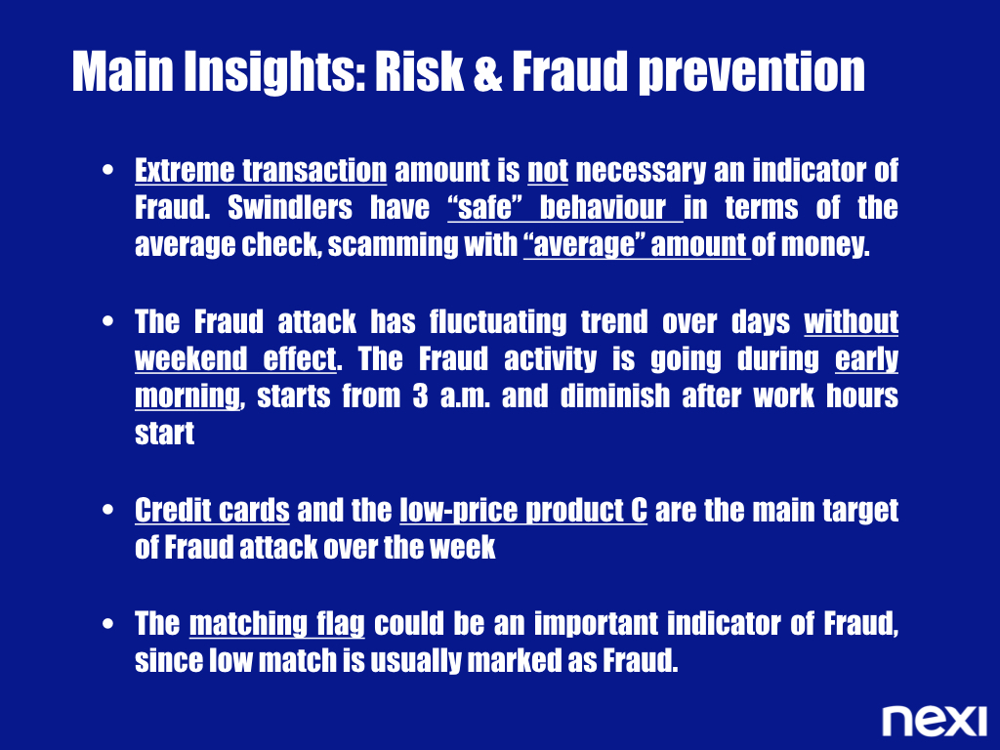

In [ ]:
fraud_share = df['isFraud'].value_counts(normalize=True).reset_index()
fraud_share.columns = ['isFraud', '%']
fraud_share['%'] *= 100


fig = px.pie(
    fraud_share,
    names='isFraud',
    values='%',
    title="The percentage of Fraud transactions is extremely lower (that's good) than Non-Fraud transactions",
    hole=0.6
)

fig.update_traces(
    textinfo='percent+label',
    pull=[0.05, 0]
)
fig.show()



### **Fraud timeline**



In [ ]:
df['isFraud'] = df['isFraud'].map({'Yes': 1, 'No': 0}) if df['isFraud'].dtype == 'object' else df['isFraud']
daily_fraud = df.groupby('trx_day')['isFraud'].sum().reset_index()

fig = px.line(
    daily_fraud,
    x='trx_day',
    y='isFraud',
    title='Peaks of Fraud at 64th, 85th, 91st, 117th, 120th days',
    labels={'isFraud': 'Count', 'trx_day': 'Day'}
)

fig.update_layout(
    plot_bgcolor='white',
    paper_bgcolor='white',
    showlegend=False,
    bargap=0.1,
    height=500,
    width=1000
)

fig.update_traces(mode='lines+markers')
fig.update_xaxes(tickmode='linear', dtick=5)
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()

In [ ]:
fraud_rate_by_day = df.groupby('trx_day')['isFraud'].mean().reset_index()

fig = px.line(
    fraud_rate_by_day,
    x='trx_day',
    y='isFraud',
    title='At days 59 and 117 there are the highes % of Fraud',
    labels={'isFraud': '% of Fraud', 'trx_day': 'day'}
)
fig.update_layout(yaxis_tickformat='.1%')
fig.update_layout(
    plot_bgcolor='white',
    paper_bgcolor='white',
    showlegend=False,
    bargap=0.1,
    height=500,
    width=1000
)

fig.update_traces(mode='lines+markers')
fig.update_xaxes(tickmode='linear', dtick=5)
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()


In [ ]:
fraud_by_hour = df.groupby('trx_hour')['isFraud'].mean().reset_index()

fig = px.line(
    fraud_by_hour,
    x='trx_hour',
    y='isFraud',
    title='Most fraud activity occurs during the early morning hours, before typical working hours',
    labels={'trx_hour': 'hour', 'isFraud': '% of Fraud'}
)
fig.update_layout(yaxis_tickformat='.1%')
fig.update_layout(
    plot_bgcolor='white',
    paper_bgcolor='white',
    showlegend=False,
    bargap=0.1,
    height=500,
    width=1000
)

fig.update_traces(mode='lines+markers')
fig.update_xaxes(tickmode='linear', dtick=1)
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()

In [ ]:
agg = df.groupby('is_weekend').agg(
    total_tx=('isFraud', 'count'),
    fraud_tx=('isFraud', 'sum')
).reset_index()
agg['fraud_rate'] = agg['fraud_tx'] / agg['total_tx'] * 100

fig = px.pie(
    agg,
    names='is_weekend',
    values='fraud_rate',
    title='Fraud could occur on Working day and Weekend',
    hole=0.4
)

fig.update_traces(
    textinfo='percent+label',
    pull=[0.05, 0],
)

fig.update_layout(
    showlegend=True,
    legend_title_text='Weekend',
    paper_bgcolor='white',
    plot_bgcolor='white'
)

fig.show()


### **Fraud transaction amount**

In [ ]:
df['isFraud'] = df['isFraud'].map({'Yes': 1, 'No': 0}) if df['isFraud'].dtype == 'object' else df['isFraud']

print("Fraud:")
print(df[df['isFraud'] == 1]['TransactionAmt'].describe())

print("\nNot Fraud:")
print(df[df['isFraud'] == 0]['TransactionAmt'].describe())

Fraud:
count    20663.000000
mean       149.244779
std        232.212163
min          0.292000
25%         35.044000
50%         75.000000
75%        161.000000
max       5191.000000
Name: TransactionAmt, dtype: float64

Not Fraud:
count    569877.000000
mean        134.511665
std         239.395078
min           0.251000
25%          43.970000
50%          68.500000
75%         120.000000
max       31937.391000
Name: TransactionAmt, dtype: float64


In [ ]:
fraud = df[df['isFraud'] == 1]['log_TransactionAmt']
not_fraud = df[df['isFraud'] == 0]['log_TransactionAmt']


fig = make_subplots(
    rows=1,
    cols=2,
    subplot_titles=[
        "Fraud: Transaction amount is smooth and centered",
        "Not Fraud: Skewed left with a narrow distribution"
    ]
)


fig.add_trace(
    go.Histogram(
        x=fraud,
        nbinsx=50,
        name='Fraud',
        marker_color='#007acc',
        opacity=0.7,
        histnorm='',
    ),
    row=1, col=1
)


fig.add_trace(
    go.Histogram(
        x=not_fraud,
        nbinsx=50,
        name='Not Fraud',
        marker_color='#007acc',
        opacity=0.7,
        histnorm='',
    ),
    row=1, col=2
)

fig.update_layout(
    plot_bgcolor='white',
    paper_bgcolor='white',
    showlegend=False,
    bargap=0.1,
    height=500,
    width=1000
)

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()


### **Cards**

In [ ]:
fraud_card = df.groupby(['card6', 'isFraud']).size().reset_index(name='count')
fraud_card['share'] = fraud_card.groupby('card6')['count'].transform(lambda x: x / x.sum())

fig = px.bar(
    fraud_card,
    x='card6',
    y='share',
    color='isFraud',
    barmode='stack',
    title='Credit cards are more likely to be the victim of Fraud',
    labels={
        'card6': 'Card category',
        'share': '% of transactions',
        'isFraud': 'Fraud'
    },
    template='plotly_white',
    text='share'
)

fig.update_traces(texttemplate='%{text:.1%}', textposition='inside')
fig.update_layout(
    yaxis_tickformat='.0%',
    xaxis_tickangle=0,
    legend_title_text='Fraud'
)

fig.show()


In [ ]:
fraud_rate = (
    df.groupby('card6')['isFraud']
    .mean()
    .reset_index()
    .rename(columns={'isFraud': 'fraud_rate'})
)

fig = px.bar(fraud_rate, x='card6', y='fraud_rate', title='Credit cards are more likely to be the victim of Fraud')
fig.update_layout(yaxis_tickformat='.1%')
fig.update_layout(
    plot_bgcolor='white',
    paper_bgcolor='white',
    showlegend=False,
    bargap=0.1,
    height=500,
    width=1000
)

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()

In [ ]:
fraud_card = df.groupby(['card4', 'isFraud']).size().reset_index(name='count')
fraud_card['share'] = fraud_card.groupby('card4')['count'].transform(lambda x: x / x.sum())

fig = px.bar(
    fraud_card,
    x='card4',
    y='share',
    color='isFraud',
    barmode='stack',
    title='Discover card holders more often are victims of Fraud',
    labels={
        'card6': 'Card type',
        'share': '% of transactons',
        'isFraud': 'Fraud'
    },
    template='plotly_white',
    text='share'
)

fig.update_traces(texttemplate='%{text:.1%}', textposition='inside')
fig.update_layout(
    yaxis_tickformat='.0%',
    xaxis_tickangle=0,
    legend_title_text='Fraud'
)

fig.show()


In [ ]:
fraud_by_weekend_card = df.groupby(['is_weekend', 'card4'])['isFraud'].mean().reset_index()

fig = px.bar(
    fraud_by_weekend_card,
    x='card4',
    y='isFraud',
    color='is_weekend',
    barmode='group',
    title='The is no difference of Fraud transactions between cards based on the Work day or Weekend',
    labels={'isFraud': '% of Fraud', 'is_weekend': 'Weekend'}
)

fig.update_layout(
    plot_bgcolor='white',
    paper_bgcolor='white',
    showlegend=True,
    bargap=0.1,
    height=500,
    width=1000
)

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)

fig.show()


In [ ]:
fraud_by_weekend_card = df.groupby(['is_weekend', 'card6'])['isFraud'].mean().reset_index()

fig = px.bar(
    fraud_by_weekend_card,
    x='card6',
    y='isFraud',
    color='is_weekend',
    barmode='group',
    title='There is no huge differnce by card category',
    labels={'isFraud': '% of Fraud', 'is_weekend': 'Weekend'}
)
fig.update_layout(yaxis_tickformat='.1%')
fig.update_layout(
    plot_bgcolor='white',
    paper_bgcolor='white',
    showlegend=True,
    bargap=0.1,
    height=500,
    width=1000
)

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()


### **Information match**

In [ ]:
fig = px.box(
    df,
    x='isFraud',
    y='num_match_flags',
    title='No Fraud has more matches, while a bit less than half of Fraud transactions have 0 matched',
    labels={'isFraud': 'Fraud', 'num_match_flags': 'Count of match'}
)

fig.update_layout(
    plot_bgcolor='white',
    paper_bgcolor='white',
    showlegend=False,
    bargap=0.1,
    height=500,
    width=1000
)

fig.update_xaxes(showgrid=False)

fig.show()


In [ ]:
match_level_fraud = df.groupby('Match_Level')['isFraud'].mean().reset_index().sort_values('isFraud', ascending=False)

fig = px.bar(
    match_level_fraud,
    x='Match_Level',
    y='isFraud',
    title='Low matches could signal about Fraud transaction',
    labels={'isFraud': '% Fraud', 'Match_Level': 'match'}
)
fig.update_layout(yaxis_tickformat='.1%')

fig.update_layout(
    plot_bgcolor='white',
    paper_bgcolor='white',
    showlegend=False,
    bargap=0.1,
    height=500,
    width=1000
)
fig.show()


### **Product**

In [ ]:
fraud_by_product = df.groupby('ProductCD')['isFraud'].mean().reset_index().sort_values('isFraud', ascending=False)

fig = px.bar(
    fraud_by_product,
    x='ProductCD',
    y='isFraud',
    title='The cheapest product code is more likely to be associated with fraud',
    labels={'ProductCD': 'Product code', 'isFraud': '% of Fraud'}
)
fig.update_layout(yaxis_tickformat='.1%')
fig.update_layout(
    plot_bgcolor='white',
    paper_bgcolor='white',
    showlegend=False,
    bargap=0.1,
    height=500,
    width=1000
)

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()

In [ ]:
fraud_by_weekend_product = df.groupby(['is_weekend', 'ProductCD'])['isFraud'].mean().reset_index()

fig = px.bar(
    fraud_by_weekend_product,
    x='ProductCD',
    y='isFraud',
    color='is_weekend',
    barmode='group',
    title="Weekends have little impact on fraud rates, despite Product H, showing a noticeable increase",
    labels={'isFraud': '% of Fraud', 'is_weekend': 'Weekend'}
)
fig.update_layout(yaxis_tickformat='.1%')
fig.update_layout(
    plot_bgcolor='white',
    paper_bgcolor='white',
    showlegend=False,
    bargap=0.1,
    height=500,
    width=1000
)

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()



### **Outliers**

In [ ]:
fraud_outlier_counts = df[df['isFraud'] == 1]['isOutlier'].value_counts().reset_index()
fraud_outlier_counts.columns = ['isOutlier', 'fraud_count']

fig = px.pie(
    fraud_outlier_counts,
    names='isOutlier',
    values='fraud_count',
    title='Fraud transactions: Outliers vs Normal',
    hole=0.4
)
fig.update_traces(textinfo='percent+label', pull=[0.05, 0])
fig.update_layout(paper_bgcolor='white', plot_bgcolor='white')
fig.show()


In [ ]:
outlier_fraud_prod = df.groupby(['ProductCD', 'isOutlier'])['isFraud'].mean().reset_index()

fig = px.bar(
    outlier_fraud_prod,
    x='ProductCD',
    y='isFraud',
    color='isOutlier',
    barmode='group',
    title='The expencive product type is often marked as outlier, which can mislead',
    labels={'isFraud': 'Доля фрода', 'isOutlier': 'Выброс'}
)
fig.update_layout(yaxis_tickformat='.1%', template='plotly_white')
fig.show()
